# Upload Data from Kaggle

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!kaggle datasets download -d therohk/ireland-historical-news

 95% 49.0M/51.8M [00:00<00:00, 55.0MB/s]
100% 51.8M/51.8M [00:00<00:00, 58.3MB/s]


In [ ]:
from zipfile import ZipFile

In [ ]:
with ZipFile('/content/ireland-historical-news.zip', 'r') as zipObj:
  zipObj.extractall('/content')

# Read data

In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from collections import Counter
import plotly.express as px
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
!pip install textacy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.7/210.7 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 69.5 MB/s eta 0:00:00


In [ ]:
## for data
import json
import pandas as pd
import numpy as np
from sklearn import metrics, manifold
## for processing
import re
import nltk
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for nlp
import spacy  #3.5.0
from spacy import displacy
import textacy  #0.12.0

## for graph
import networkx as nx



In [ ]:
headlines_df = pd.read_csv('/content/ireland-news-headlines.csv')

In [ ]:
headlines_df

,publish_date,headline_category,headline_text
0,19960102,news,UUP sees possibility of voting Major out
1,19960102,news,Pubs targeted as curbs on smoking are extended
2,19960102,news,Papers reveal secret links with O'Neill cabinet
3,19960102,news,Domestic chaos as Italy takes EU presidency
4,19960102,news,Learning about the star to which we owe life
...,...,...,...
1611490,20210630,news.politics.oireachtas,Reserve members of Defence Forces to be allowe...
1611491,20210630,culture,Maureen Dowd: Joe Biden is 'crazy about the Ir...
1611492,20210630,sport.others,Andy Murray rolls back the years to own Centre...
1611493,20210630,news.health,Delta variant could do 'significant damage' in...


In [ ]:
headlines_df = headlines_df.dropna(subset=['headline_text'])

# Data exploration

Turn publish date to pd.datetime


In [ ]:
headlines_df['publish_date'] = pd.to_datetime(headlines_df['publish_date'].apply(lambda date: str(date)[:4] + '-' + str(date)[4:6] + '-' + str(date)[6:]))

<ipython-input-13-b9298a49bed0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  headlines_df['publish_date'] = pd.to_datetime(headlines_df['publish_date'].apply(lambda date: str(date)[:4] + '-' + str(date)[4:6] + '-' + str(date)[6:]))


Subtrcact main category and sub-categories

In [ ]:
headlines_df['main_category'] = headlines_df['headline_category'].apply(lambda cat: cat.split('.')[0] if '.' in cat else cat)

<ipython-input-14-de00c9457ae4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  headlines_df['main_category'] = headlines_df['headline_category'].apply(lambda cat: cat.split('.')[0] if '.' in cat else cat)


In [ ]:
headlines_df

,publish_date,headline_category,headline_text,main_category
0,1996-01-02,news,UUP sees possibility of voting Major out,news
1,1996-01-02,news,Pubs targeted as curbs on smoking are extended,news
2,1996-01-02,news,Papers reveal secret links with O'Neill cabinet,news
3,1996-01-02,news,Domestic chaos as Italy takes EU presidency,news
4,1996-01-02,news,Learning about the star to which we owe life,news
...,...,...,...,...
1611490,2021-06-30,news.politics.oireachtas,Reserve members of Defence Forces to be allowe...,news
1611491,2021-06-30,culture,Maureen Dowd: Joe Biden is 'crazy about the Ir...,culture
1611492,2021-06-30,sport.others,Andy Murray rolls back the years to own Centre...,sport
1611493,2021-06-30,news.health,Delta variant could do 'significant damage' in...,news


# Categories # Analysis


In [ ]:
category_counts = headlines_df.groupby('main_category').count()['headline_text']
category_percents = category_counts.apply(lambda x: x / category_counts.sum() * 100)
fig = px.pie(names=category_percents.index, values=category_percents.values, title='Percentage of Headlines by Category')
fig.show()


# Trend over time

In [ ]:
headlines_df['year'] = headlines_df['publish_date'].apply(lambda date: date.year)

<ipython-input-17-67a1bbb62f8d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:


# Group the headlines by year and main category
df = headlines_df.groupby(['year', 'main_category']).count().reset_index()

# Create the stacked bar chart
fig = px.bar(df, x='year', y='headline_text', color='main_category')

# Set the chart title and axis labels
fig.update_layout(title='Number of Headlines by Main Category Over Time per Year',
                  xaxis_title='Year',
                  yaxis_title='Number of Headlines')

# Show the chart
fig.show()


# Top words per category

In [ ]:
'''
Preprocess a string.
:parameter
    :param text: string - name of column containing text
    :param lst_stopwords: list - list of stopwords to remove
    :param flg_stemm: bool - whether stemming is to be applied
    :param flg_lemm: bool - whether lemmitisation is to be applied
:return
    cleaned text
'''
def utils_preprocess_text(text, flg_stemm=False, flg_lemm=True, lst_stopwords=None):
    ## clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())

    ## Tokenize (convert from string to list)
    lst_text = text.split()
    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in
                    lst_stopwords]

    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]

    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        lst_text = [lem.lemmatize(word) for word in lst_text]

    return lst_text

In [ ]:
lst_stopwords = nltk.corpus.stopwords.words("english")


In [ ]:
headlines_df["clean_text"] = headlines_df["headline_text"].apply(lambda x:
          utils_preprocess_text(x, flg_stemm=False, flg_lemm=True,
          lst_stopwords=lst_stopwords))
headlines_df

<ipython-input-21-24aeeaef9d27>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,publish_date,headline_category,headline_text,main_category,year,clean_text
0,1996-01-02,news,UUP sees possibility of voting Major out,news,1996,"[uup, see, possibility, voting, major]"
1,1996-01-02,news,Pubs targeted as curbs on smoking are extended,news,1996,"[pub, targeted, curb, smoking, extended]"
2,1996-01-02,news,Papers reveal secret links with O'Neill cabinet,news,1996,"[paper, reveal, secret, link, oneill, cabinet]"
3,1996-01-02,news,Domestic chaos as Italy takes EU presidency,news,1996,"[domestic, chaos, italy, take, eu, presidency]"
4,1996-01-02,news,Learning about the star to which we owe life,news,1996,"[learning, star, owe, life]"
...,...,...,...,...,...,...
1611490,2021-06-30,news.politics.oireachtas,Reserve members of Defence Forces to be allowe...,news,2021,"[reserve, member, defence, force, allowed, ser..."
1611491,2021-06-30,culture,Maureen Dowd: Joe Biden is 'crazy about the Ir...,culture,2021,"[maureen, dowd, joe, biden, crazy, irish, plan..."
1611492,2021-06-30,sport.others,Andy Murray rolls back the years to own Centre...,sport,2021,"[andy, murray, roll, back, year, centre, court]"
1611493,2021-06-30,news.health,Delta variant could do 'significant damage' in...,news,2021,"[delta, variant, could, significant, damage, p..."


In [ ]:
# Group the data by main category
groups = headlines_df.groupby('main_category')

# Define the number of top words to select
num_top_words = 100

# Create a new dataframe that contains the top words and their frequencies for each main category
top_words_df = pd.DataFrame(columns=['category', 'word', 'freq'])
for name, group in groups:
    # Create a bag of words by combining all the headline text for this category
    bag_of_words = [word for headline in group['clean_text'] for word in headline]
    # Count the frequency of each word
    word_freq = Counter(bag_of_words)
    # Sort the words by frequency in descending order
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
    # Select the top words and their frequencies
    top_words = sorted_words[:num_top_words]
    # Add the top words and their frequencies to the new dataframe
    for word, freq in top_words:
        top_words_df = top_words_df.append({'category': name, 'word': word, 'freq': freq}, ignore_index=True)



<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-22-0a87e071b647>:20: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Us

In [ ]:
# Create the treemap with Plotly
fig = px.treemap(top_words_df, path=['category', 'word'], values='freq', color='freq', color_continuous_scale='Greens')
fig.update_layout(title='Top Words by Category')
fig.show()

In [ ]:
# Exclude ["irish", "dublin", "ireland"] words and "new"
top_words_df = top_words_df.query('word not in ["irish", "dublin", "ireland", "new"]')

In [ ]:
# Create the treemap with Plotly
fig = px.treemap(top_words_df, path=['category', 'word'], values='freq', color='freq', color_continuous_scale='Greens')
fig.update_layout(title='Top Words by Category')
fig.show()

# Sentiment

In [ ]:

from textblob import TextBlob


# Define a function to calculate the sentiment polarity of a given headline
def get_sentiment(text):
  if not pd.isnull(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity

# Apply the get_sentiment function to each headline text in the dataframe
headlines_df['sentiment'] = headlines_df['headline_text'].apply(get_sentiment)



<ipython-input-40-7de7abc23293>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Create a histogram of the sentiment polarity values
fig = px.histogram(headlines_df, x='sentiment', nbins=20, color_discrete_sequence=['blue'])
fig.update_layout(title='Distribution of Sentiment Polarity in Headlines',
                  xaxis_title='Sentiment Polarity', yaxis_title='Count')
fig.show()

In [ ]:
sentiment_by_category = headlines_df.groupby('main_category')['sentiment'].mean().reset_index().sort_values('sentiment', ascending=False)

# Create the bar plot with a green-to-red color scale
fig = px.bar(sentiment_by_category, x='main_category', y='sentiment',
             title='Average Sentiment Score by Main Category',
             color='sentiment',
             color_continuous_scale='RdYlGn')
fig.show()

# Entities Anlysis using Networx

In [ ]:
nlp = spacy.load("en_core_web_sm")
sample_df = headlines_df.sample(n=10000)
indexes = sample_df.index
clean_text_as_lst = sample_df['clean_text'].tolist()




In [ ]:
## extract entities and relations
dic = {"id":[], "category":[], "text":[], "entity":[], "relation":[], "object":[]}
i = -1
for n,sentence in enumerate(clean_text_as_lst):
    i += 1
    sentence_index = indexes[i]
    sentence = " ".join(sentence)
    sentence = nlp(sentence)
    lst_generators = list(textacy.extract.subject_verb_object_triples(sentence))
    for sent in lst_generators:
        subj = "_".join(map(str, sent.subject))
        obj  = "_".join(map(str, sent.object))
        relation = "_".join(map(str, sent.verb))
        dic["id"].append(n)
        category = headlines_df['main_category'].iloc[sentence_index]
        dic["category"].append(category)
        dic["text"].append(sentence.text)
        dic["entity"].append(subj)
        dic["object"].append(obj)
        dic["relation"].append(relation)


## create dataframe
dtf = pd.DataFrame(dic)

dtf.head()

,id,category,text,entity,relation,object
0,0,sport,listless leeds make sad reid,leeds,make,reid
1,10,news,u plastic firm provide 115 job dundalk,plastic_firm,provide,job_dundalk
2,16,sport,leitrim learn little facile victory,leitrim,learn,victory
3,21,news,smithwick tribunal hear evidence witness,smithwick_tribunal,hear,evidence_witness
4,22,news,farmer initiative aim cut accident,initiative_aim,cut,accident


# Graph

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



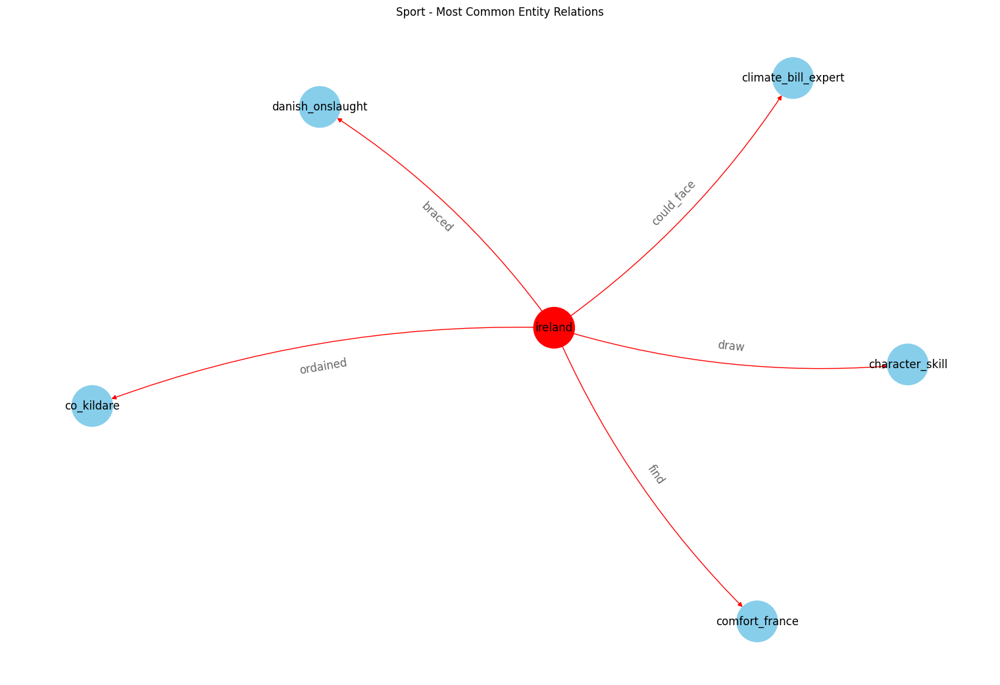

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



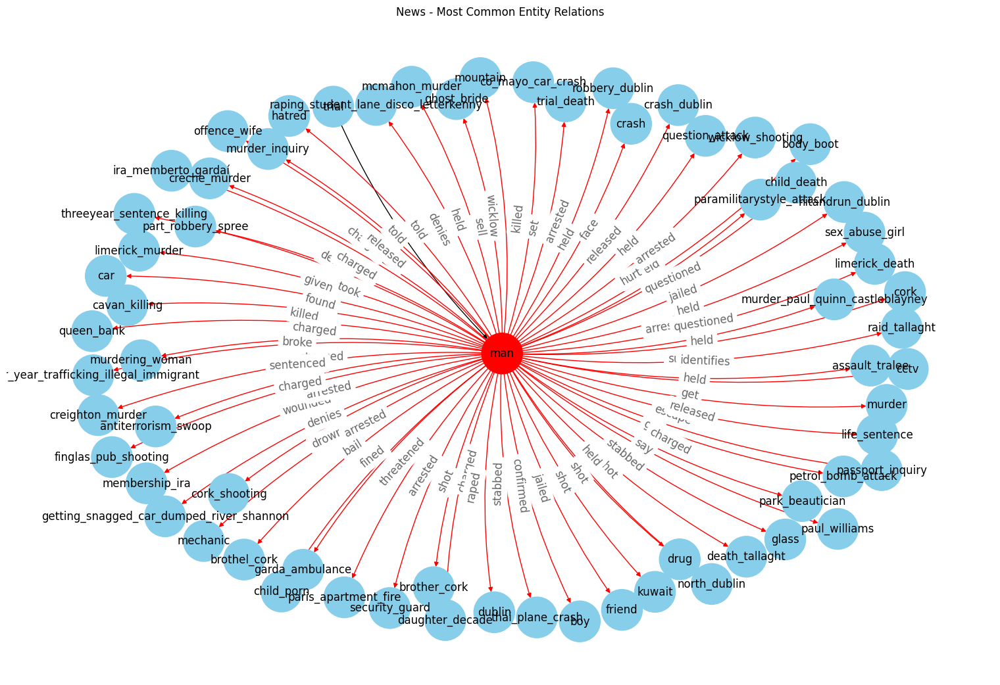

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



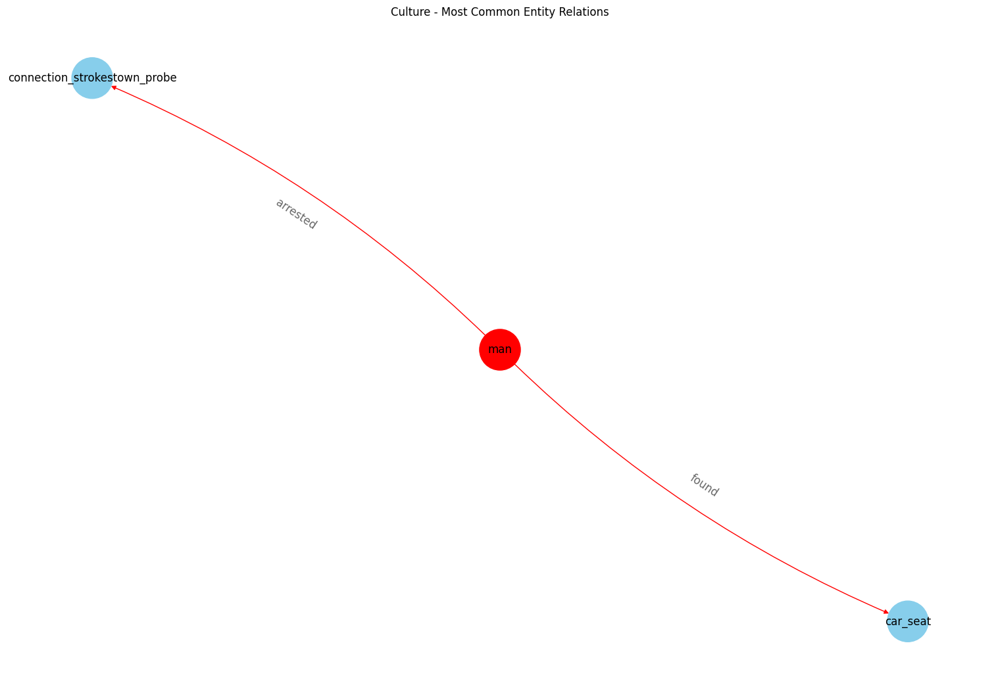

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



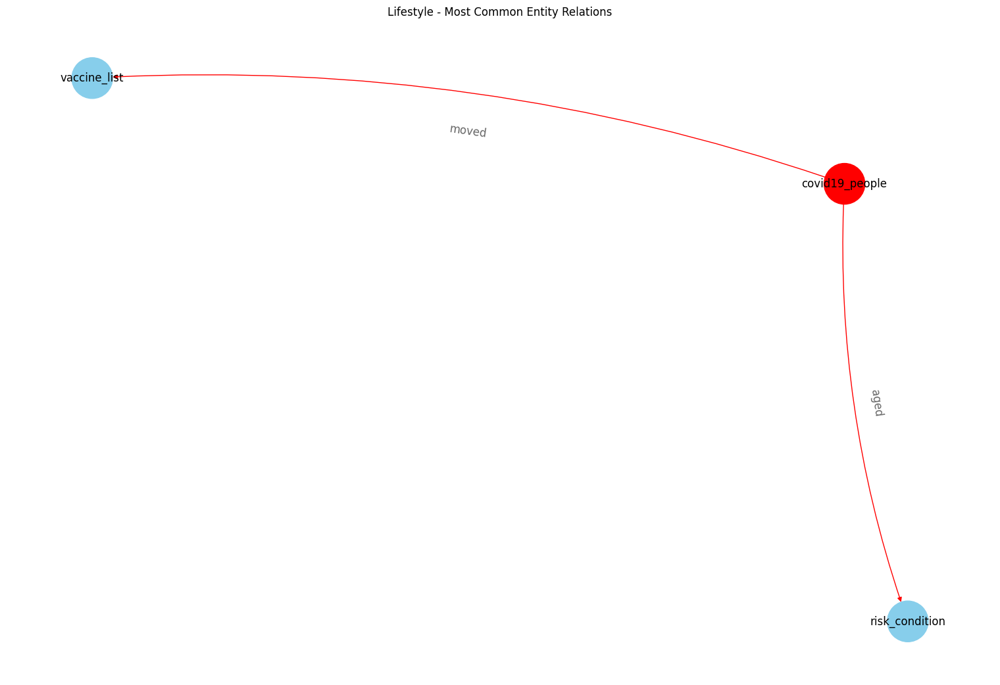

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



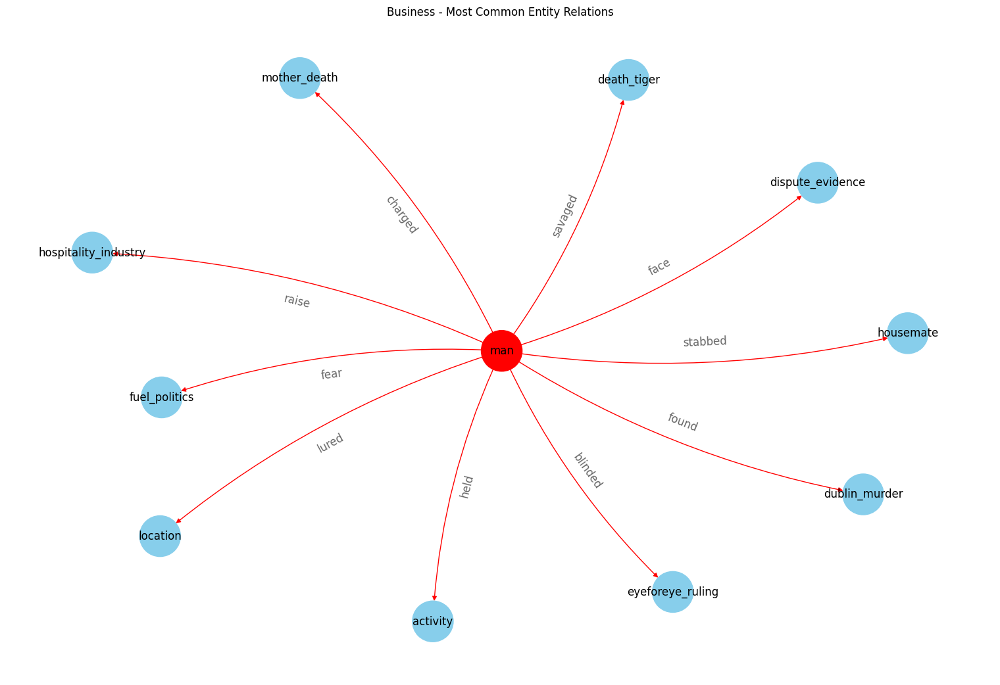

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



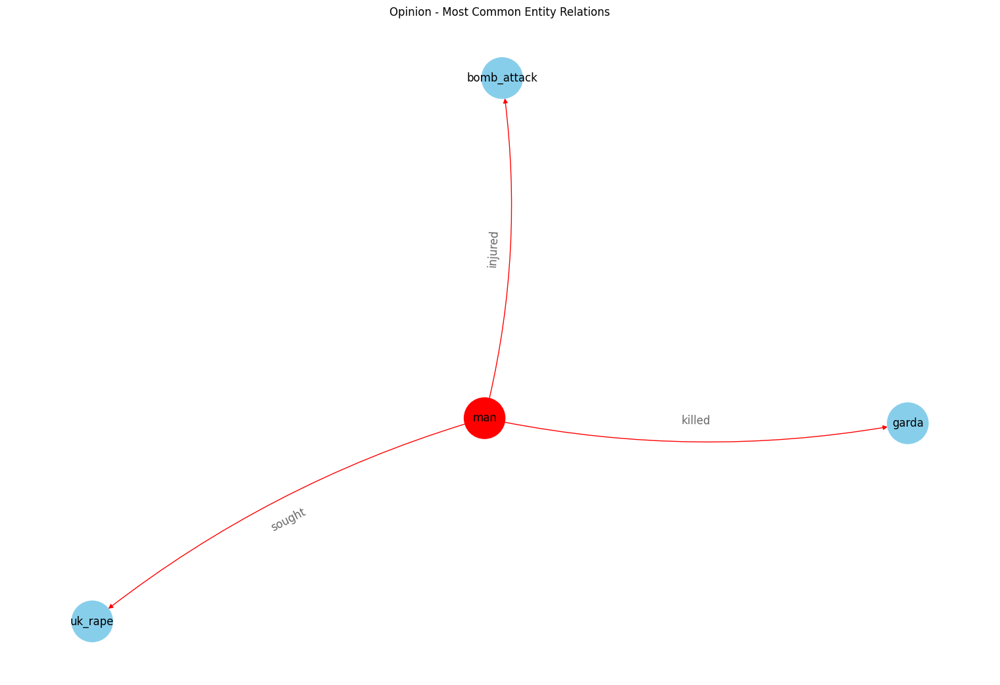

In [ ]:
categories = dtf['category'].unique()
for cat in categories:
  curr_cat_df = dtf[dtf['category'] == cat]
  most_mentioned_entity = curr_cat_df["entity"].value_counts().index[0]
  tmp = curr_cat_df[(curr_cat_df["entity"]==most_mentioned_entity) | (curr_cat_df["object"]==most_mentioned_entity)]
  ## create small graph
  G = nx.from_pandas_edgelist(tmp, source="entity", target="object",
                              edge_attr="relation",
                              create_using=nx.DiGraph())


  ## plot
  plt.figure(figsize=(15,10))

  pos = nx.spring_layout(G, k=1)
  node_color = ["red" if node==most_mentioned_entity else "skyblue" for node in G.nodes]
  edge_color = ["red" if edge[0]==most_mentioned_entity else "black" for edge in G.edges]

  nx.draw(G, pos=pos, with_labels=True, node_color=node_color,
          edge_color=edge_color, cmap=plt.cm.Dark2,
          node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1')

  nx.draw_networkx_edge_labels(G, pos=pos, label_pos=0.5,
                          edge_labels=nx.get_edge_attributes(G,'relation'),
                          font_size=12, font_color='black', alpha=0.6)
  plt.title(f"{cat.capitalize()} - Most Common Entity Relations")
  plt.show()

# Clean Data for Model

In [ ]:
headlines_df['clean_text_for_y'] = headlines_df['clean_text'].apply(lambda text: " ".join(text))


<ipython-input-26-bac32e85fe73>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
headlines_df

,publish_date,headline_category,headline_text,main_category,year,clean_text,clean_text_for_y
0,1996-01-02,news,UUP sees possibility of voting Major out,news,1996,"[uup, see, possibility, voting, major]",uup see possibility voting major
1,1996-01-02,news,Pubs targeted as curbs on smoking are extended,news,1996,"[pub, targeted, curb, smoking, extended]",pub targeted curb smoking extended
2,1996-01-02,news,Papers reveal secret links with O'Neill cabinet,news,1996,"[paper, reveal, secret, link, oneill, cabinet]",paper reveal secret link oneill cabinet
3,1996-01-02,news,Domestic chaos as Italy takes EU presidency,news,1996,"[domestic, chaos, italy, take, eu, presidency]",domestic chaos italy take eu presidency
4,1996-01-02,news,Learning about the star to which we owe life,news,1996,"[learning, star, owe, life]",learning star owe life
...,...,...,...,...,...,...,...
1611490,2021-06-30,news.politics.oireachtas,Reserve members of Defence Forces to be allowe...,news,2021,"[reserve, member, defence, force, allowed, ser...",reserve member defence force allowed serve ove...
1611491,2021-06-30,culture,Maureen Dowd: Joe Biden is 'crazy about the Ir...,culture,2021,"[maureen, dowd, joe, biden, crazy, irish, plan...",maureen dowd joe biden crazy irish plan celebr...
1611492,2021-06-30,sport.others,Andy Murray rolls back the years to own Centre...,sport,2021,"[andy, murray, roll, back, year, centre, court]",andy murray roll back year centre court
1611493,2021-06-30,news.health,Delta variant could do 'significant damage' in...,news,2021,"[delta, variant, could, significant, damage, p...",delta variant could significant damage partial...


## Take only 5% of the data beacuase it is too much data for COLAB GPU for training, and divide it evenly between the categories

In [ ]:
sample_ratio = 0.05
category_counts = headlines_df['main_category'].value_counts()
smallest_category_count = category_counts.min()
sample_size = int(sample_ratio * smallest_category_count)
sampled_data = pd.DataFrame()
for category in category_counts.index:
    category_data = headlines_df[headlines_df['main_category'] == category].sample(sample_size, random_state=42)
    sampled_data = pd.concat([sampled_data, category_data])
sampled_data = sampled_data.reset_index(drop=True)

In [ ]:
category_counts = sampled_data.groupby('main_category').count()['headline_text']
category_percents = category_counts.apply(lambda x: x / category_counts.sum() * 100)
fig = px.pie(names=category_percents.index, values=category_percents.values, title='Percentage of Headlines by Category')
fig.show()


In [ ]:
category_counts = sampled_data['main_category'].value_counts()
fig = px.bar(x=category_counts.index, y=category_counts.values, labels={'x':'Main Category', 'y':'Number of Records'})
fig.show()

# Part II - Finetune Models

In [ ]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 60.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 75.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.7 MB/s eta 0:00:00


In [ ]:
!pip install sentencepiece

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.3 MB/s eta 0:00:00


In [ ]:
import torch
import transformers
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np

from tabulate import tabulate
from tqdm import trange
import random



# Example of Bert tokenizer implamantation

In [ ]:
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)


In [ ]:
category_mapping = {category: i for i, category in enumerate(sampled_data['main_category'].unique())}
sampled_data['category_numeric'] = sampled_data['main_category'].map(category_mapping)

In [ ]:
sampled_data

,publish_date,headline_category,headline_text,main_category,year,clean_text,clean_text_for_y,category_numeric
0,2008-05-13,news.health,China cracks down on smokers,news,2008,"[china, crack, smoker]",china crack smoker,0
1,1998-10-29,news,Evidence of writer found,news,1998,"[evidence, writer, found]",evidence writer found,0
2,1999-08-14,news,Mud slide kills 14; injures 50,news,1999,"[mud, slide, kill, 14, injures, 50]",mud slide kill 14 injures 50,0
3,2016-03-22,news.ireland,Courts-martial papers of 1916 leaders released...,news,2016,"[courtsmartial, paper, 1916, leader, released,...",courtsmartial paper 1916 leader released online,0
4,1998-12-19,news,Ireland's rate of cannabis-related arrests fou...,news,1998,"[ireland, rate, cannabisrelated, arrest, fourt...",ireland rate cannabisrelated arrest fourth eu ...,0
...,...,...,...,...,...,...,...,...
28795,2017-11-16,lifestyle.people,Barbie in a hijab: one small step towards embr...,lifestyle,2017,"[barbie, hijab, one, small, step, towards, emb...",barbie hijab one small step towards embracing ...,5
28796,2010-10-16,lifestyle.travel,Loveable Lisbon,lifestyle,2010,"[loveable, lisbon]",loveable lisbon,5
28797,2018-08-12,lifestyle.health-family.fitness,Quick guide to becoming super strong – by the ...,lifestyle,2018,"[quick, guide, becoming, super, strong, woman,...",quick guide becoming super strong woman lifted...,5
28798,2000-10-26,lifestyle.homes,Piffle of the Week,lifestyle,2000,"[piffle, week]",piffle week,5


In [ ]:
text = sampled_data['clean_text_for_y'].values
labels = sampled_data['category_numeric'].values

In [ ]:

def print_rand_sentence():
  '''Displays the tokens and respective IDs of a random text sample'''
  index = random.randint(0, len(text)-1)
  table = np.array([tokenizer.tokenize(text[index]),
                    tokenizer.convert_tokens_to_ids(tokenizer.tokenize(text[index]))]).T
  print(table)

In [ ]:
print_rand_sentence()

[['go' '2175']
 ['kid' '4845']]


In [ ]:

token_id = []
attention_masks = []

def preprocessing(input_text, tokenizer):
  '''
  Returns <class transformers.tokenization_utils_base.BatchEncoding> with the following fields:
    - input_ids: list of token ids
    - token_type_ids: list of token type ids
    - attention_mask: list of indices (0,1) specifying which tokens should considered by the model (return_attention_mask = True).
  '''
  return tokenizer.encode_plus(
                        input_text,
                        add_special_tokens = True,
                        max_length = 16,
                        pad_to_max_length = True,
                        return_attention_mask = True,
                        return_tensors = 'pt'
                   )


for sample in text:
  encoding_dict = preprocessing(sample, tokenizer)
  token_id.append(encoding_dict['input_ids'])
  attention_masks.append(encoding_dict['attention_mask'])


token_id = torch.cat(token_id, dim = 0)
attention_masks = torch.cat(attention_masks, dim = 0)
labels = torch.tensor(labels)


Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2377: FutureWarning:

The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).



In [ ]:

def print_rand_sentence_encoding():
  '''Displays tokens, token IDs and attention mask of a random text sample'''
  index = random.randint(0, len(text) - 1)
  tokens = tokenizer.tokenize(tokenizer.decode(token_id[index]))
  token_ids = [i.numpy() for i in token_id[index]]
  attention = [i.numpy() for i in attention_masks[index]]

  table = np.array([tokens, token_ids, attention]).T
  print(tabulate(table,
                 headers = ['Tokens', 'Token IDs', 'Attention Mask'],
                 tablefmt = 'fancy_grid'))

print_rand_sentence_encoding()

╒═════════════╤═════════════╤══════════════════╕
│ Tokens      │   Token IDs │   Attention Mask │
╞═════════════╪═════════════╪══════════════════╡
│ [CLS]       │         101 │                1 │
├─────────────┼─────────────┼──────────────────┤
│ immigration │        7521 │                1 │
├─────────────┼─────────────┼──────────────────┤
│ employment  │        6107 │                1 │
├─────────────┼─────────────┼──────────────────┤
│ [SEP]       │         102 │                1 │
├─────────────┼─────────────┼──────────────────┤
│ [PAD]       │           0 │                0 │
├─────────────┼─────────────┼──────────────────┤
│ [PAD]       │           0 │                0 │
├─────────────┼─────────────┼──────────────────┤
│ [PAD]       │           0 │                0 │
├─────────────┼─────────────┼──────────────────┤
│ [PAD]       │           0 │                0 │
├─────────────┼─────────────┼──────────────────┤
│ [PAD]       │           0 │                0 │
├─────────────┼─────

# Models Training Robust Mechanism


In [ ]:
sampled_data

,publish_date,headline_category,headline_text,main_category,year,clean_text,clean_text_for_y,category_numeric
0,2008-05-13,news.health,China cracks down on smokers,news,2008,"[china, crack, smoker]",china crack smoker,0
1,1998-10-29,news,Evidence of writer found,news,1998,"[evidence, writer, found]",evidence writer found,0
2,1999-08-14,news,Mud slide kills 14; injures 50,news,1999,"[mud, slide, kill, 14, injures, 50]",mud slide kill 14 injures 50,0
3,2016-03-22,news.ireland,Courts-martial papers of 1916 leaders released...,news,2016,"[courtsmartial, paper, 1916, leader, released,...",courtsmartial paper 1916 leader released online,0
4,1998-12-19,news,Ireland's rate of cannabis-related arrests fou...,news,1998,"[ireland, rate, cannabisrelated, arrest, fourt...",ireland rate cannabisrelated arrest fourth eu ...,0
...,...,...,...,...,...,...,...,...
28795,2017-11-16,lifestyle.people,Barbie in a hijab: one small step towards embr...,lifestyle,2017,"[barbie, hijab, one, small, step, towards, emb...",barbie hijab one small step towards embracing ...,5
28796,2010-10-16,lifestyle.travel,Loveable Lisbon,lifestyle,2010,"[loveable, lisbon]",loveable lisbon,5
28797,2018-08-12,lifestyle.health-family.fitness,Quick guide to becoming super strong – by the ...,lifestyle,2018,"[quick, guide, becoming, super, strong, woman,...",quick guide becoming super strong woman lifted...,5
28798,2000-10-26,lifestyle.homes,Piffle of the Week,lifestyle,2000,"[piffle, week]",piffle week,5


In [ ]:
import torch
import torch.nn.utils.prune as prune
import torch.quantization
import torch.nn.functional as F
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset

# Set the random seed for reproducibility
torch.manual_seed(42)

# Load the dataset and split into training and testing setsy
X_train, X_test, y_train, y_test = train_test_split(sampled_data['clean_text_for_y'], sampled_data['main_category'], test_size=0.2, random_state=42)

In [ ]:
from tqdm import tqdm
class Model():
  """
    A class representing a DL NLP pre-trained model.

    Attributes:
        model_name (str): The name of the model.

   Methods:
        __init__(model_name): Initializes a new instance of the Model class.
        fit(epcohs): Trains the model on the given training data with selected number of epochs.
        evaluate(): Evaluates the model on the validation data and plots a confusion matrix.
        predict(headline): Predicts the main category label for a given headline.

    Example:
        model = Model('albert-base-v2')
    """

  def __init__(self, model_name) -> None:
     self.model_name = model_name
     self.teacher_model_name = 'distilbert-base-uncased'
     self.student_model_name = model_name
     self.teacher_model = None
     self.student_model = None

  def prune(self, pruning_ratio, save_path):
        """
        Applies magnitude-based pruning to the model.

        Args:
            pruning_ratio (float): The ratio of weights to prune.

        Returns:
            None
        """
        # Load Trained Model
        self.load_model(save_path)
        # Define the pruning method
        pruning_method = prune.L1Unstructured

        # Create the pruning mask for each applicable module in the model
        for module in self.model.modules():
            if isinstance(module, torch.nn.Linear):
                prune.random_unstructured(module, name="weight", amount=pruning_ratio)

  def quantize_model(self, save_path):
        """
        Applies quantization to the model.

        Returns:
            None
        """
        # Load Trained Model
        self.load_model(save_path)
        # Perform quantize
        quantized_model = torch.quantization.quantize_dynamic(
            self.model, {torch.nn.Linear}, dtype=torch.qint8
        )
        self.model = quantized_model

  def distill(self, temperature, alpha):
        """
        Performs distillation with a teacher-student method.

        Args:
            temperature (float): The temperature for distillation.
            alpha (float): The weight of the distillation loss.

        Returns:
            None
        """
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        # Initialize the tokenizer and encode the headlines
        tokenizer = AutoTokenizer.from_pretrained(self.student_model_name)
        encoded_inputs_train = tokenizer(list(X_train), truncation=True, padding=True)

        # Convert the labels to numerical format
        label_encoder = LabelEncoder()
        y_train_encoded = label_encoder.fit_transform(y_train)

        # Create PyTorch tensors from the encoded inputs and labels
        train_inputs = torch.tensor(encoded_inputs_train['input_ids'])
        train_masks = torch.tensor(encoded_inputs_train['attention_mask'])
        train_labels = torch.tensor(y_train_encoded)

        # Create a DataLoader for the training set
        train_dataset = TensorDataset(train_inputs, train_masks, train_labels)
        train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
        # Load the pre-trained teacher model
        self.teacher_model = AutoModelForSequenceClassification.from_pretrained(self.teacher_model_name)
        self.teacher_model.to(device)
        # Load the student model architecture
        self.student_model = AutoModelForSequenceClassification.from_pretrained(self.student_model_name)
        self.student_model.to(device)

        # Set the models to evaluation mode
        self.teacher_model.eval()
        self.student_model.train()

        # Define the optimizer and learning rate
        optimizer = torch.optim.AdamW(self.student_model.parameters(), lr=2e-5)

        # Set the device to GPU if available, otherwise use CPU
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


        # Define the loss function
        loss_fn = torch.nn.KLDivLoss(reduction='batchmean')

        # Training loop
        for epoch in range(3):
            for batch in train_dataloader:
                inputs, masks, labels = batch
                inputs = inputs.to(device)
                masks = masks.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                # Forward pass with the teacher model
                with torch.no_grad():
                    teacher_outputs = self.teacher_model(inputs, masks).logits

                # Forward pass with the student model
                student_outputs = self.student_model(inputs, masks).logits

                # Apply temperature scaling to the teacher outputs
                teacher_outputs /= temperature
                student_outputs /= temperature

                # Calculate the distillation loss
                distillation_loss = loss_fn(F.log_softmax(student_outputs, dim=1), F.softmax(teacher_outputs, dim=1))

                # Calculate the classification loss
                classification_loss = F.cross_entropy(student_outputs, labels)

                # Calculate the total loss
                total_loss = alpha * distillation_loss + (1 - alpha) * classification_loss

                # Backward pass and optimization step
                total_loss.backward()
                optimizer.step()

  def fit(self, original_model=False, epochs=3):
    """
    Trains the model on the given training data.

    Args:
        epochs = Number of selected epochs

    Returns:
        None
    """
    # Initialize the tokenizer and encode the headlines
    self.tokenizer = AutoTokenizer.from_pretrained(self.model_name)
    encoded_inputs_train = self.tokenizer(list(X_train), truncation=True, padding=True)
    encoded_inputs_test = self.tokenizer(list(X_test), truncation=True, padding=True)

    # Convert the labels to numerical format
    self.label_encoder = LabelEncoder()
    y_train_encoded = self.label_encoder.fit_transform(y_train)
    y_test_encoded = self.label_encoder.transform(y_test)

    # Create PyTorch tensors from the encoded inputs and labels
    train_inputs = torch.tensor(encoded_inputs_train['input_ids'])
    train_masks = torch.tensor(encoded_inputs_train['attention_mask'])
    train_labels = torch.tensor(y_train_encoded)
    test_inputs = torch.tensor(encoded_inputs_test['input_ids'])
    test_masks = torch.tensor(encoded_inputs_test['attention_mask'])
    test_labels = torch.tensor(y_test_encoded)

    # Create a DataLoader for training and testing sets
    train_dataset = TensorDataset(train_inputs, train_masks, train_labels)
    test_dataset = TensorDataset(test_inputs, test_masks, test_labels)
    train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    test_dataloader = DataLoader(test_dataset, batch_size=16)

    if original_model:
      # Initialize the model for sequence classification
      self.model = AutoModelForSequenceClassification.from_pretrained(self.model_name, num_labels=len(self.label_encoder.classes_))

    # Set the device to GPU if available, otherwise use CPU
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.model.to(device)

    # Define the optimizer and learning rate
    optimizer = torch.optim.AdamW(self.model.parameters(), lr=2e-5)
    self.preds_labels = []
    self.true_labels = []
    # Training loop
    self.model.train()
    for epoch in tqdm(range(epochs), desc="Epochs"):
        for batch in train_dataloader:
            inputs, masks, labels = batch
            inputs = inputs.to(device)
            masks = masks.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = self.model(input_ids=inputs, attention_mask=masks, labels=labels)
            loss = outputs.loss
            loss.backward()
            optimizer.step()

    # Evaluation
    self.model.eval()
    total_correct = 0
    total_samples = 0
    with torch.no_grad():
        for batch in test_dataloader:
            inputs, masks, labels = batch
            inputs = inputs.to(device)
            masks = masks.to(device)
            labels = labels.to(device)

            outputs = self.model(input_ids=inputs, attention_mask=masks)
            _, predicted_labels = torch.max(outputs.logits, dim=1)

            total_correct += (predicted_labels == labels).sum().item()
            total_samples += labels.size(0)
            self.preds_labels.append(list(predicted_labels.cpu()))
            self.true_labels.append(list(labels.cpu()))
    if original_model:
      self.save_model()

  def evaluate(self, name):
    """
      Evaluates the model on the validation data and plots a confusion matrix.
      Returns:Model Accuracy
    """
    cat_num_dict = {}
    for num_cat in sampled_data['category_numeric'].unique():
      cat_num_dict[num_cat] = sampled_data['main_category'].unique()[num_cat]
    preds, label_ids = np.array(self.preds_labels).flatten(), np.array(self.true_labels).flatten()
    predicted, y_test = [cat_num_dict[pred] for pred in preds], [cat_num_dict[label] for label in label_ids]
    classes = np.unique(y_test)
    y_test_array = pd.get_dummies(y_test, drop_first=False).values

    ## Accuracy, Precision, Recall
    accuracy = metrics.accuracy_score(y_test, predicted)
    print("\n\n\nValidation Accuracy:",  round(accuracy,2))
    print("Detail:")
    print(metrics.classification_report(y_test, predicted))

    ## Plot confusion matrix
    cm = metrics.confusion_matrix(y_test, predicted)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
                cbar=False)
    model_new_name = self.model_name.capitalize() + f' {name.capitalize()}'
    ax.set(xlabel="Pred", ylabel="True", xticklabels=classes,
          yticklabels=classes, title=f"{model_new_name} Confusion matrix")

    plt.show()
    return round(accuracy, 2)

  def predict(self, headline):
    """
    Predicts the main category label for a given headline.

    Args:
        headline (str): The headline text to predict the main category label for.

    Returns:
        str: The predicted main category label.
    """
    # Tokenize the headline
    inputs = self.tokenizer(headline, truncation=True, padding=True, return_tensors='pt')

    # Set the device to GPU if available, otherwise use CPU
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    inputs = {key: value.to(device) for key, value in inputs.items()}

    # Make the prediction
    with torch.no_grad():
        self.model.eval()

        outputs = self.model(**inputs)
        predicted_labels = torch.argmax(outputs.logits, dim=1).cpu().numpy()

    # Convert the predicted label to the corresponding main category
    predicted_category = self.label_encoder.inverse_transform(predicted_labels)[0]
    print(f'Headline: "{headline}"')
    print(f"Predicted Category: {str(predicted_category).capitalize()}\n")

  def predict_headlines(self):
    # Try some headlines from my own :)
    self.predict('Nuggets won the NBA')
    self.predict('What a Motherless Son Knows About Fatherhood')
    self.predict('Ukraines offensive is underway. Heres whats happened so far')
    self.predict('Fed takes a timeout')
    self.predict('Chronic stress can affect your health. One activity can help')
    self.predict('The Arabic language is vital to educational systems of the future')

  def save_model(self, save_dir='/content'):
        if self.model is None:
            raise ValueError("No model has been trained. Please fit the model before saving.")

        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, "trained_model.pt")
        torch.save(self.model.state_dict(), save_path)

  def load_model(self, save_path):
        self.model = AutoModelForSequenceClassification.from_pretrained(self.model_name, num_labels=self.model.config.num_labels)
        self.model.load_state_dict(torch.load(save_path))



Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i




Validation Accuracy: 0.71
Detail:
              precision    recall  f1-score   support

    business       0.63      0.70      0.66       943
     culture       0.72      0.68      0.70       951
   lifestyle       0.81      0.84      0.82       954
        news       0.76      0.75      0.75      1003
     opinion       0.67      0.64      0.65       933
       sport       0.66      0.66      0.66       976

    accuracy                           0.71      5760
   macro avg       0.71      0.71      0.71      5760
weighted avg       0.71      0.71      0.71      5760



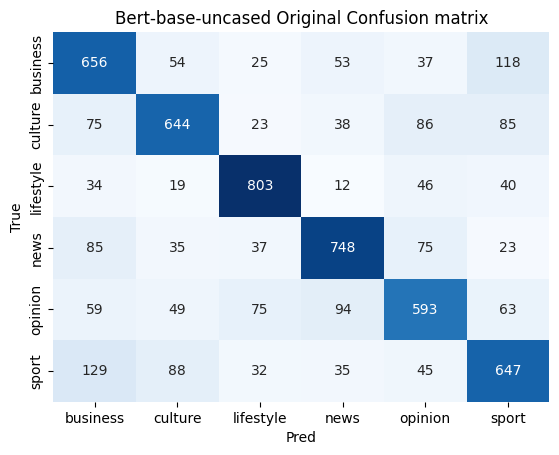

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: News

Headline: "Fed takes a timeout"
Predicted Category: Lifestyle

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i




Validation Accuracy: 0.67
Detail:
              precision    recall  f1-score   support

    business       0.61      0.66      0.63       943
     culture       0.65      0.64      0.65       951
   lifestyle       0.75      0.83      0.78       954
        news       0.74      0.70      0.72      1003
     opinion       0.65      0.56      0.60       933
       sport       0.62      0.63      0.62       976

    accuracy                           0.67      5760
   macro avg       0.67      0.67      0.67      5760
weighted avg       0.67      0.67      0.67      5760



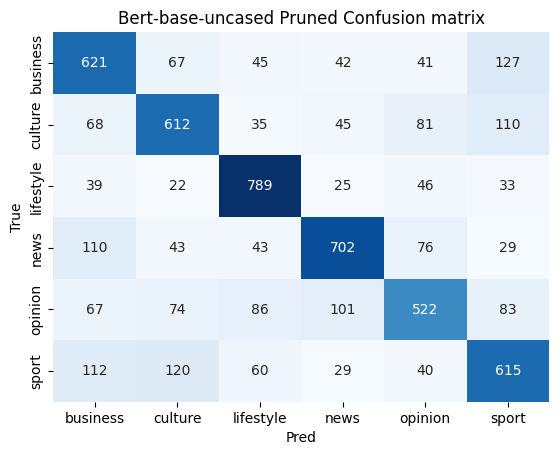

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Lifestyle

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i




Validation Accuracy: 0.68
Detail:
              precision    recall  f1-score   support

    business       0.63      0.66      0.64       943
     culture       0.55      0.80      0.65       951
   lifestyle       0.86      0.75      0.80       954
        news       0.72      0.77      0.75      1003
     opinion       0.74      0.53      0.62       933
       sport       0.72      0.57      0.64       976

    accuracy                           0.68      5760
   macro avg       0.70      0.68      0.68      5760
weighted avg       0.70      0.68      0.68      5760



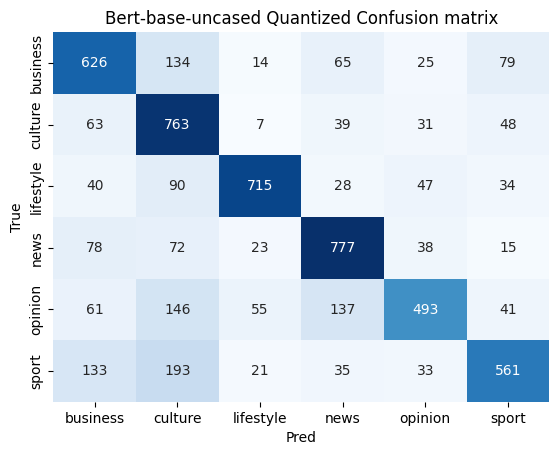

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Opinion

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Lifestyle

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i




Validation Accuracy: 0.69
Detail:
              precision    recall  f1-score   support

    business       0.66      0.63      0.65       943
     culture       0.69      0.66      0.67       951
   lifestyle       0.81      0.82      0.81       954
        news       0.67      0.80      0.73      1003
     opinion       0.71      0.52      0.60       933
       sport       0.61      0.68      0.64       976

    accuracy                           0.69      5760
   macro avg       0.69      0.69      0.68      5760
weighted avg       0.69      0.69      0.68      5760



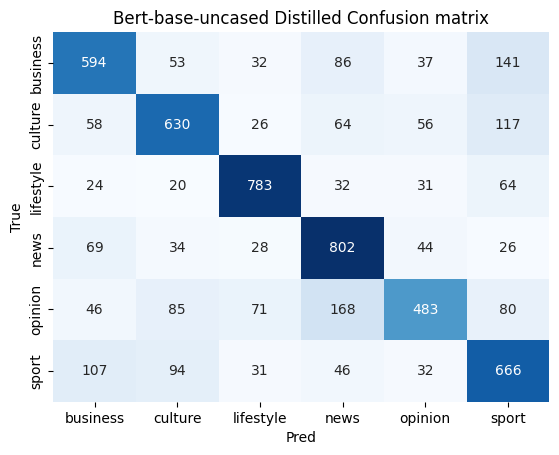

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Business

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at albert-base-v2 were not used when initializing AlbertForSequenceClassification: ['predictions.dense.bias', 'predictions.bias', 'predictions.dense.weight', 'predictions.decoder.bias', 'predictions.LayerNorm.weight', 'predictions.LayerNorm.bias']
- This IS expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model 




Validation Accuracy: 0.17
Detail:
              precision    recall  f1-score   support

    business       0.00      0.00      0.00       943
     culture       0.17      1.00      0.28       951
   lifestyle       0.00      0.00      0.00       954
        news       0.00      0.00      0.00      1003
     opinion       0.00      0.00      0.00       933
       sport       0.00      0.00      0.00       976

    accuracy                           0.17      5760
   macro avg       0.03      0.17      0.05      5760
weighted avg       0.03      0.17      0.05      5760



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



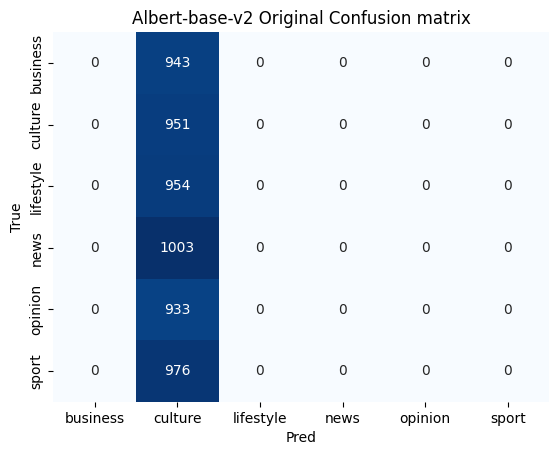

Headline: "Nuggets won the NBA"
Predicted Category: Opinion

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Opinion

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Opinion

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Opinion

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at albert-base-v2 were not used when initializing AlbertForSequenceClassification: ['predictions.dense.bias', 'predictions.bias', 'predictions.dense.weight', 'predictions.decoder.bias', 'predictions.LayerNorm.weight', 'predictions.LayerNorm.bias']
- This IS expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model 




Validation Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

    business       0.57      0.62      0.59       943
     culture       0.64      0.57      0.61       951
   lifestyle       0.74      0.79      0.76       954
        news       0.73      0.70      0.71      1003
     opinion       0.65      0.53      0.58       933
       sport       0.56      0.65      0.60       976

    accuracy                           0.65      5760
   macro avg       0.65      0.64      0.64      5760
weighted avg       0.65      0.65      0.64      5760



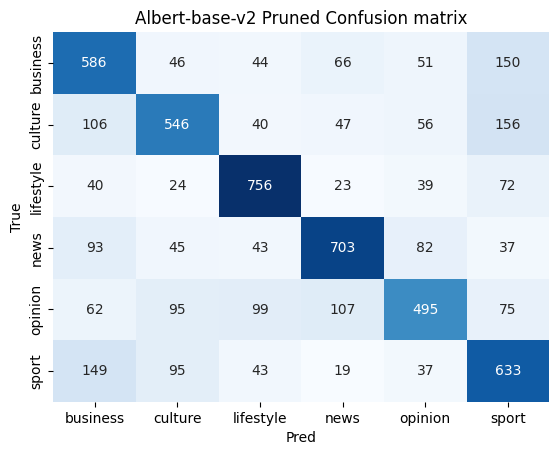

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Culture

Headline: "Fed takes a timeout"
Predicted Category: Opinion

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at albert-base-v2 were not used when initializing AlbertForSequenceClassification: ['predictions.dense.bias', 'predictions.bias', 'predictions.dense.weight', 'predictions.decoder.bias', 'predictions.LayerNorm.weight', 'predictions.LayerNorm.bias']
- This IS expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model 




Validation Accuracy: 0.16
Detail:
              precision    recall  f1-score   support

    business       0.00      0.00      0.00       943
     culture       0.00      0.00      0.00       951
   lifestyle       0.00      0.00      0.00       954
        news       0.00      0.00      0.00      1003
     opinion       0.16      1.00      0.28       933
       sport       0.00      0.00      0.00       976

    accuracy                           0.16      5760
   macro avg       0.03      0.17      0.05      5760
weighted avg       0.03      0.16      0.05      5760



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



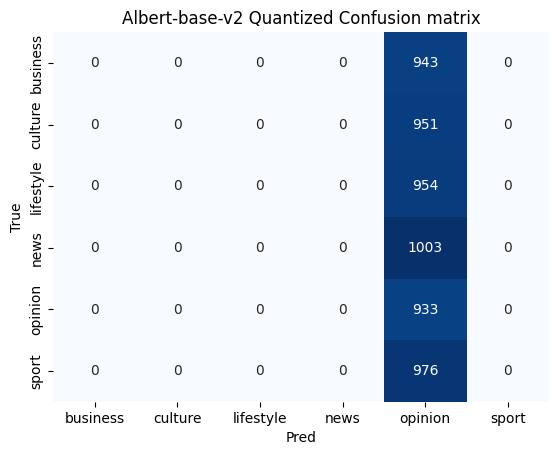

Headline: "Nuggets won the NBA"
Predicted Category: News

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: News

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: News

Headline: "Fed takes a timeout"
Predicted Category: News

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: News

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: News



Some weights of the model checkpoint at albert-base-v2 were not used when initializing AlbertForSequenceClassification: ['predictions.dense.bias', 'predictions.bias', 'predictions.dense.weight', 'predictions.decoder.bias', 'predictions.LayerNorm.weight', 'predictions.LayerNorm.bias']
- This IS expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model 




Validation Accuracy: 0.64
Detail:
              precision    recall  f1-score   support

    business       0.65      0.50      0.57       943
     culture       0.57      0.64      0.60       951
   lifestyle       0.67      0.86      0.75       954
        news       0.62      0.82      0.71      1003
     opinion       0.68      0.46      0.55       933
       sport       0.66      0.53      0.59       976

    accuracy                           0.64      5760
   macro avg       0.64      0.63      0.63      5760
weighted avg       0.64      0.64      0.63      5760



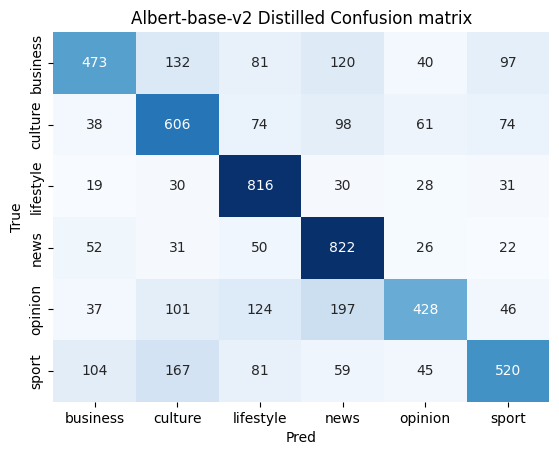

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: News

Headline: "Fed takes a timeout"
Predicted Category: Business

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: News



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:454: UserWarning:

The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Some weights of the model checkpoint at microsoft/deberta-v3-base were not used when initializing DebertaV2ForSequenceClassification: ['mask_predictions.LayerNorm.weight', 'lm_predictions.lm_head.LayerNorm.weight', 'mask_predictions.dense.bias', 'mask_predictions.dense.weight', 'lm_predictions.lm_head.LayerNorm.bias', 'lm_predictions.lm_head.bias', 'lm_predictions.lm_head.dense.bias', 'lm_predictions.lm_head.dense.weight', 'mask_predictions.classifier.weight', 'mask_predictions.LayerNorm.bias', 'mask_predictions.classifier.bias']
- This IS expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a




Validation Accuracy: 0.68
Detail:
              precision    recall  f1-score   support

    business       0.72      0.56      0.63       943
     culture       0.66      0.72      0.69       951
   lifestyle       0.65      0.89      0.75       954
        news       0.74      0.76      0.75      1003
     opinion       0.67      0.59      0.63       933
       sport       0.67      0.57      0.62       976

    accuracy                           0.68      5760
   macro avg       0.69      0.68      0.68      5760
weighted avg       0.69      0.68      0.68      5760



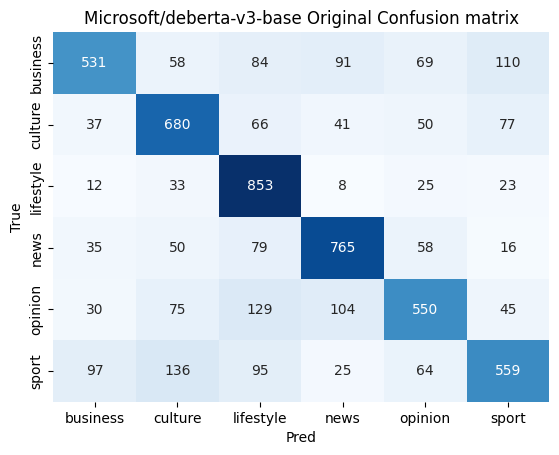

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: News

Headline: "Fed takes a timeout"
Predicted Category: Business

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at microsoft/deberta-v3-base were not used when initializing DebertaV2ForSequenceClassification: ['mask_predictions.LayerNorm.weight', 'lm_predictions.lm_head.LayerNorm.weight', 'mask_predictions.dense.bias', 'mask_predictions.dense.weight', 'lm_predictions.lm_head.LayerNorm.bias', 'lm_predictions.lm_head.bias', 'lm_predictions.lm_head.dense.bias', 'lm_predictions.lm_head.dense.weight', 'mask_predictions.classifier.weight', 'mask_predictions.LayerNorm.bias', 'mask_predictions.classifier.bias']
- This IS expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a




Validation Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

    business       0.65      0.55      0.59       943
     culture       0.57      0.72      0.64       951
   lifestyle       0.71      0.82      0.76       954
        news       0.67      0.77      0.72      1003
     opinion       0.65      0.55      0.59       933
       sport       0.67      0.49      0.57       976

    accuracy                           0.65      5760
   macro avg       0.65      0.65      0.65      5760
weighted avg       0.65      0.65      0.65      5760



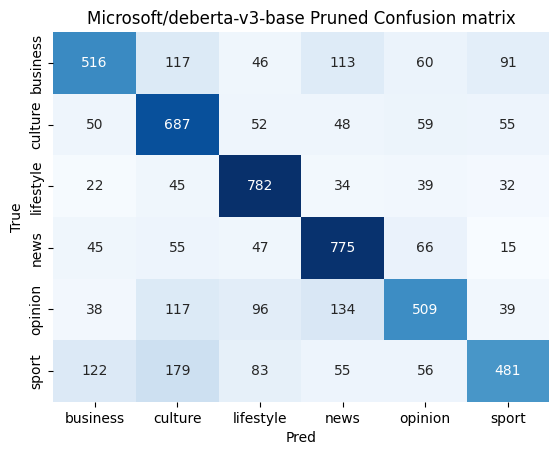

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Opinion

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Sport

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Business

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Some weights of the model checkpoint at microsoft/deberta-v3-base were not used when initializing DebertaV2ForSequenceClassification: ['mask_predictions.LayerNorm.weight', 'lm_predictions.lm_head.LayerNorm.weight', 'mask_predictions.dense.bias', 'mask_predictions.dense.weight', 'lm_predictions.lm_head.LayerNorm.bias', 'lm_predictions.lm_head.bias', 'lm_predictions.lm_head.dense.bias', 'lm_predictions.lm_head.dense.weight', 'mask_predictions.classifier.weight', 'mask_predictions.LayerNorm.bias', 'mask_predictions.classifier.bias']
- This IS expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a




Validation Accuracy: 0.69
Detail:
              precision    recall  f1-score   support

    business       0.67      0.63      0.65       943
     culture       0.66      0.70      0.68       951
   lifestyle       0.79      0.81      0.80       954
        news       0.73      0.77      0.75      1003
     opinion       0.70      0.55      0.62       933
       sport       0.60      0.66      0.63       976

    accuracy                           0.69      5760
   macro avg       0.69      0.69      0.69      5760
weighted avg       0.69      0.69      0.69      5760



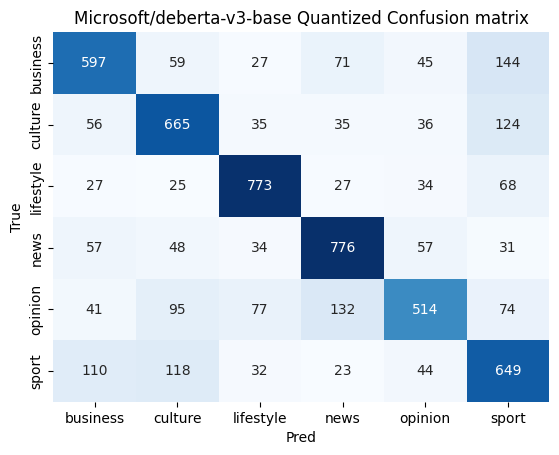

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: News

Headline: "Fed takes a timeout"
Predicted Category: Sport

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:454: UserWarning:

The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.
Some weights of the model checkpoint at microsoft/deberta-v3-base were not used when initializing DebertaV2ForSequenceClassification: ['mask




Validation Accuracy: 0.66
Detail:
              precision    recall  f1-score   support

    business       0.60      0.68      0.64       943
     culture       0.65      0.66      0.65       951
   lifestyle       0.69      0.84      0.76       954
        news       0.77      0.69      0.73      1003
     opinion       0.56      0.64      0.60       933
       sport       0.76      0.48      0.59       976

    accuracy                           0.66      5760
   macro avg       0.67      0.66      0.66      5760
weighted avg       0.67      0.66      0.66      5760



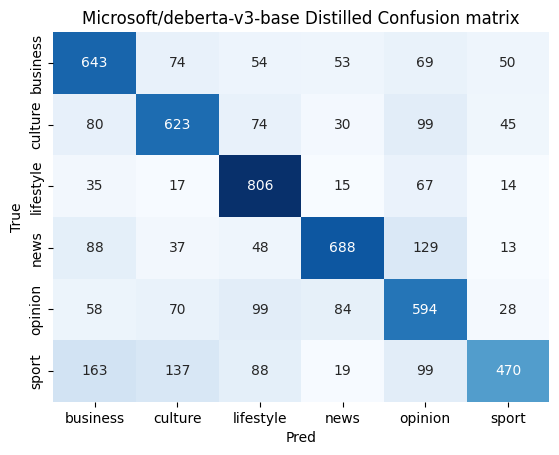

Headline: "Nuggets won the NBA"
Predicted Category: Sport

Headline: "What a Motherless Son Knows About Fatherhood"
Predicted Category: Lifestyle

Headline: "Ukraines offensive is underway. Heres whats happened so far"
Predicted Category: Opinion

Headline: "Fed takes a timeout"
Predicted Category: Sport

Headline: "Chronic stress can affect your health. One activity can help"
Predicted Category: Lifestyle

Headline: "The Arabic language is vital to educational systems of the future"
Predicted Category: Opinion



In [ ]:
# Finetune Models
model_names = ['bert-base-uncased', 'roberta-base', 'albert-base-v2', 'google/electra-base-generator', 'microsoft/deberta-v3-base']
model_names = ['bert-base-uncased', 'albert-base-v2', 'microsoft/deberta-v3-base']
save_path = '/content/trained_model.pt'
model_types = ['Original', 'Pruned', 'Quantized', 'Distilled']

accuracy_results = []
model_index_names = []

for model_name in model_names:
  model_results = []
  # # Original train & Save model
  curr_model = Model(model_name)
  curr_model.fit(epochs=2, original_model=True)
  original_accuracy = curr_model.evaluate(name='original')
  curr_model.predict_headlines()
  model_results.append(original_accuracy)
  model_index_names.append(curr_model.model_name.capitalize())

  # Apply pruning
  pruning_ratio = 0.5  # Example pruning ratio of 50%
  curr_model.prune(pruning_ratio, save_path)
  # Retrain the pruned model
  curr_model.fit(epochs=2)
  pruned_accuracy = curr_model.evaluate(name='pruned')
  curr_model.predict_headlines()
  model_results.append(pruned_accuracy)
  model_name_pruned = curr_model.model_name.capitalize() + ' Pruned'
  model_index_names.append(model_name_pruned)

  # Apply qunatization
  curr_model.quantize_model(save_path)
  # Retrain the quantized model
  curr_model.fit(epochs=2)
  quantized_accuracy = curr_model.evaluate(name='quantized')
  curr_model.predict_headlines()
  model_results.append(quantized_accuracy)
  model_name_quantized = curr_model.model_name.capitalize() + ' Quantized'
  model_index_names.append(model_name_quantized)

  # Apply distill
  curr_model.distill(temperature=2.0, alpha=0.5)
  # Retrain the quantized model
  curr_model.fit(epochs=2)
  quantized_accuracy = curr_model.evaluate(name='distilled')
  curr_model.predict_headlines()
  model_results.append(quantized_accuracy)
  model_name_distilled = curr_model.model_name.capitalize() + ' Distilled'
  model_index_names.append(model_name_distilled)

  accuracy_results.append(model_results)





In [ ]:
accuracy_results, model_types, model_index_names

([[0.71, 0.67, 0.68, 0.69],
  [0.17, 0.65, 0.16, 0.64],
  [0.68, 0.65, 0.69, 0.66]],
 ['Original', 'Pruned', 'Quantized', 'Distilled'],
 ['Bert-base-uncased',
  'Bert-base-uncased Pruned',
  'Bert-base-uncased Quantized',
  'Bert-base-uncased Distilled',
  'Albert-base-v2',
  'Albert-base-v2 Pruned',
  'Albert-base-v2 Quantized',
  'Albert-base-v2 Distilled',
  'Microsoft/deberta-v3-base',
  'Microsoft/deberta-v3-base Pruned',
  'Microsoft/deberta-v3-base Quantized',
  'Microsoft/deberta-v3-base Distilled'])

In [ ]:
model_index_names = ['Bert', 'Alberta', 'Deberta']

In [ ]:
results_df = pd.DataFrame(data=accuracy_results, columns=model_types, index=model_index_names)

In [ ]:
print(results_df)

         Original  Pruned  Quantized  Distilled
Bert         0.71    0.67       0.68       0.69
Alberta      0.17    0.65       0.16       0.64
Deberta      0.68    0.65       0.69       0.66


In [ ]:
results_df.to_excel('Models Accuracy Results.xlsx')